<a href="https://colab.research.google.com/github/Mac16661/NvidiaAutoDrive/blob/main/AutoPilotMK1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch
import torchvision
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import random

# Fetching Training Data

In [2]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 25.34 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [3]:
import pandas as pd

df = pd.read_csv('/content/track/driving_log.csv')

In [4]:
df.head()

,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0,0.1,0.2,0.6497864
0,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.627942
1,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.622910
2,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.619162
3,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.615438
4,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.610506


# Data Pre-Processing

In [5]:
def img_path(path):
  x = path.split("\\")
  return x[-1]

In [6]:
df.columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
df['center'][0]

df['center'] = df['center'].apply(img_path)
df['left'] = df['left'].apply(img_path)
df['right'] = df['right'].apply(img_path)

In [7]:
df.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
1,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
2,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
3,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438
4,center_2018_07_16_17_11_43_930.jpg,left_2018_07_16_17_11_43_930.jpg,right_2018_07_16_17_11_43_930.jpg,0.0,0.0,0.0,0.610506


Removing some zero values from steering

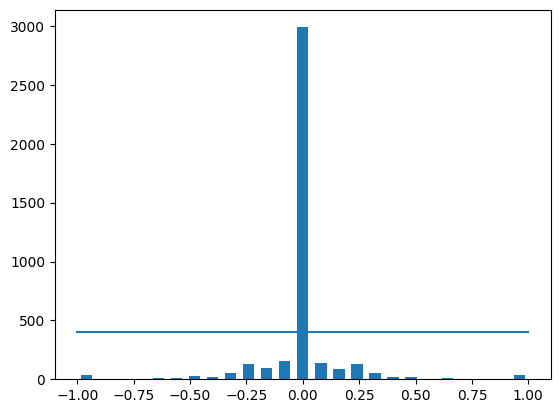

In [8]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(df['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']), np.max(df['steering'])), (samples_per_bin, samples_per_bin))

In [9]:
df.shape

(4052, 7)

In [10]:
remove_list = []
for j in range(num_bins):
  list_ = []

  for i in range(len(df['steering'])):
    if df['steering'][i] >= bins[j] and df['steering'][i] <= bins[j+1]:
      list_.append(i)

  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)


In [11]:
print('removed:', len(remove_list))
df.drop(df.index[remove_list], inplace=True)
print('remaining:', len(df))

removed: 2589
remaining: 1463


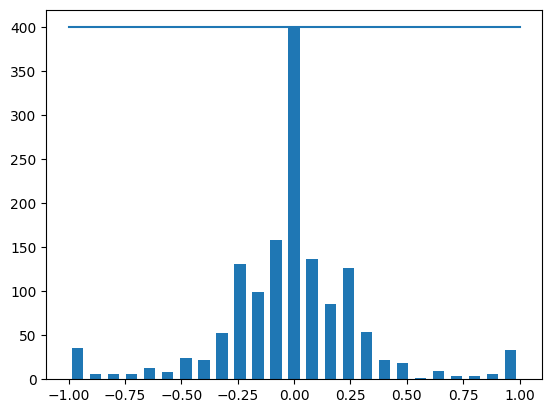

In [12]:
hist, _ = np.histogram(df['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(df['steering']), np.max(df['steering'])), (samples_per_bin, samples_per_bin))

In [13]:
!cd /content/track/IMG && ls


Streaming output truncated to the last 5000 lines.
center_2018_07_16_17_13_01_434.jpg  left_2018_07_16_17_15_25_144.jpg
center_2018_07_16_17_13_01_503.jpg  left_2018_07_16_17_15_25_216.jpg
center_2018_07_16_17_13_01_574.jpg  left_2018_07_16_17_15_25_290.jpg
center_2018_07_16_17_13_01_650.jpg  left_2018_07_16_17_15_25_362.jpg
center_2018_07_16_17_13_01_722.jpg  left_2018_07_16_17_15_25_433.jpg
center_2018_07_16_17_13_01_793.jpg  left_2018_07_16_17_15_25_500.jpg
center_2018_07_16_17_13_01_859.jpg  left_2018_07_16_17_15_25_574.jpg
center_2018_07_16_17_13_01_931.jpg  left_2018_07_16_17_15_25_641.jpg
center_2018_07_16_17_13_02_004.jpg  left_2018_07_16_17_15_25_710.jpg
center_2018_07_16_17_13_02_076.jpg  left_2018_07_16_17_15_25_779.jpg
center_2018_07_16_17_13_02_145.jpg  left_2018_07_16_17_15_25_849.jpg
center_2018_07_16_17_13_02_216.jpg  left_2018_07_16_17_15_25_919.jpg
center_2018_07_16_17_13_02_286.jpg  left_2018_07_16_17_15_25_989.jpg
center_2018_07_16_17_13_02_356.jpg  left_2018_07_16_

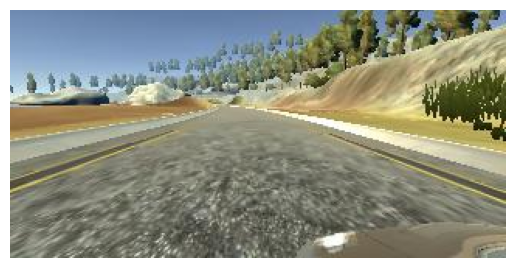

In [14]:
imgl = mpimg.imread('/content/track/IMG/left_2018_07_16_17_12_02_302.jpg')
imgc = mpimg.imread('/content/track/IMG/center_2018_07_16_17_16_01_616.jpg')
imgr = mpimg.imread('/content/track/IMG/right_2018_07_16_17_16_32_161.jpg')

plt.imshow(imgl)
plt.axis('off')  # Turn off axis
plt.show()

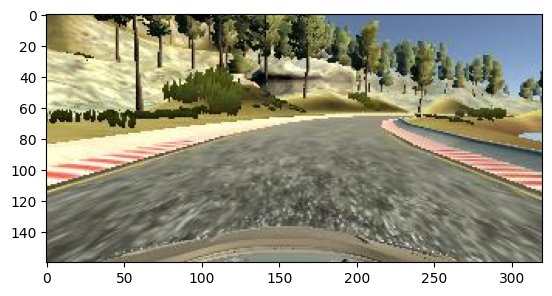

In [15]:
plt.imshow(imgc)
plt.show()

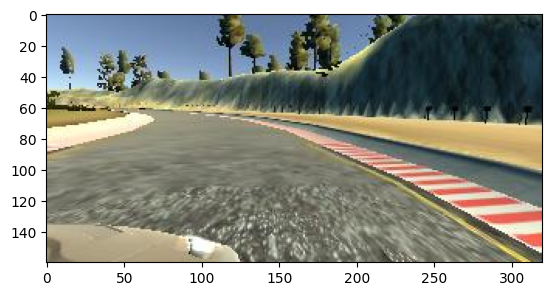

In [16]:
plt.imshow(imgr)
plt.show()

In [17]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(df)):
    indexed_data = df.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

# Train Test Split

In [18]:
datadir = '/content/track'
image_paths, steerings = load_img_steering(datadir + '/IMG', df)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


In [19]:
print( image_paths[21], "-> " ,steerings[21])

/content/track/IMG/center_2018_07_16_17_11_45_052.jpg ->  0.0


Text(0.5, 1.0, 'Validation set')

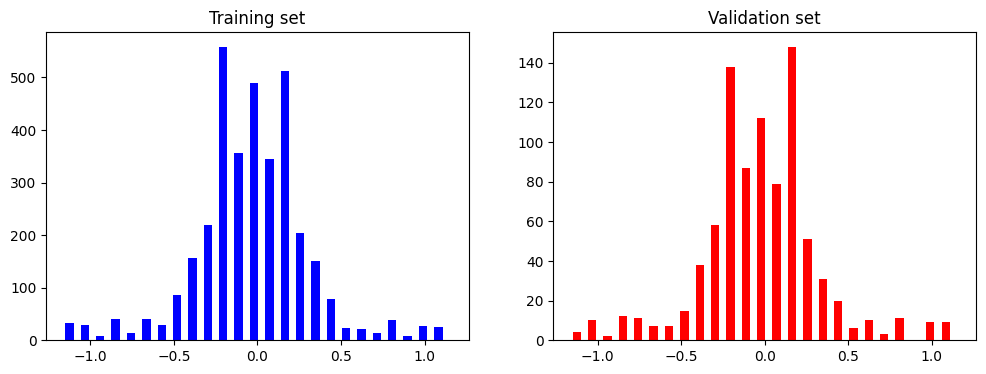

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

# Image Augmentation

Text(0.5, 1.0, 'Zoomed Image')

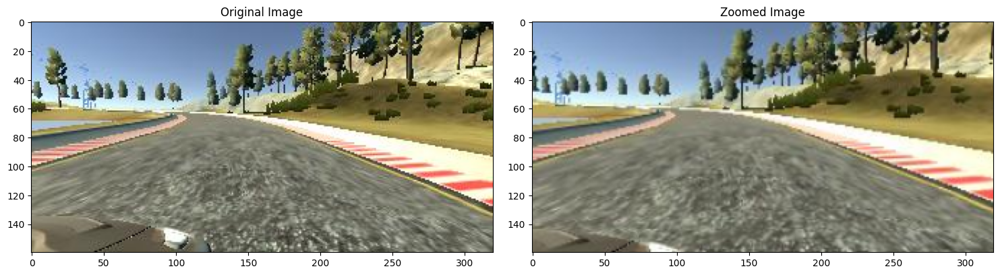

In [21]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

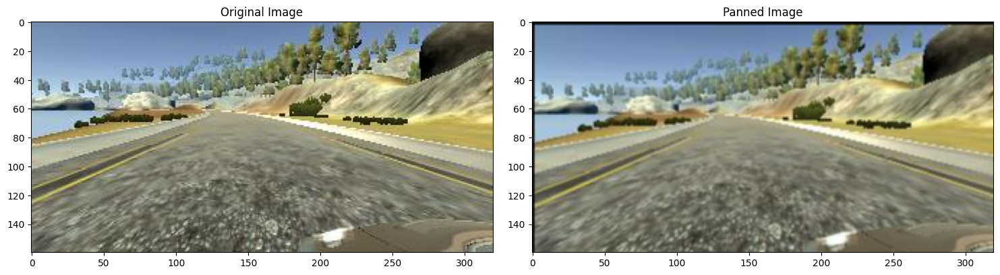

In [22]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

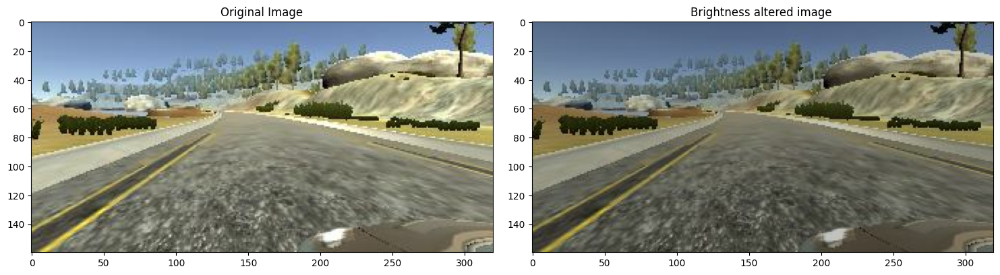

In [23]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.15')

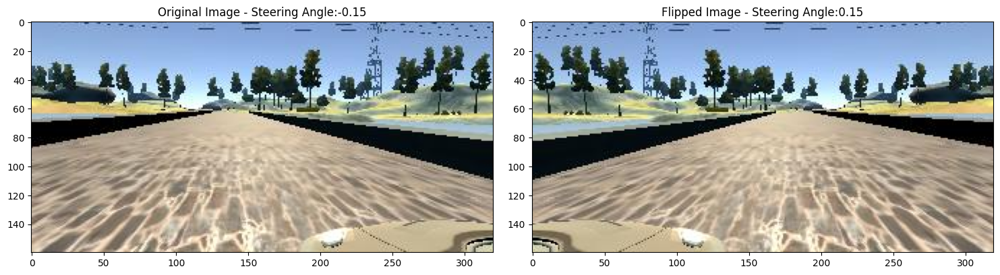

In [24]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [25]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

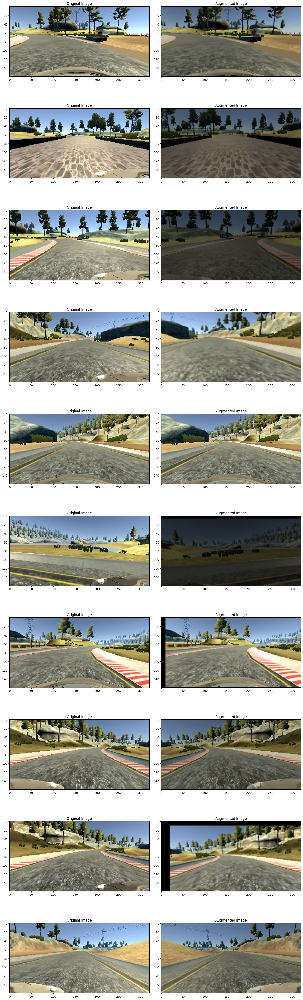

In [26]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [27]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img


Text(0.5, 1.0, 'Preprocessed Image')

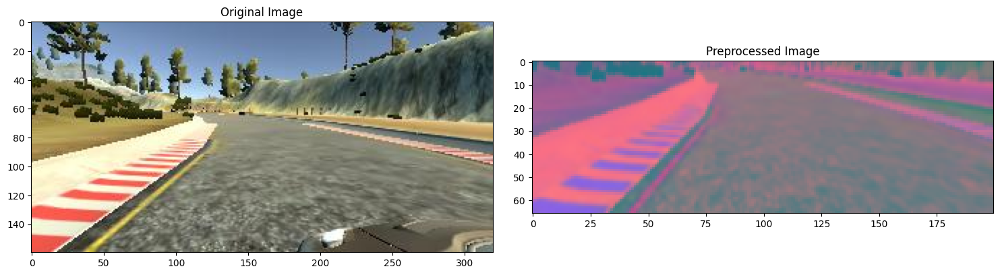

In [28]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [29]:
def toTensor(preprocessed_image):
  img = torch.from_numpy(preprocessed_image.astype(np.float32))
  img = img.permute(2, 0, 1)
  #img.shape
  return img

a = toTensor(preprocessed_image)
a.shape

torch.Size([3, 66, 200])

# Creating CustomDataset and Batches

In [30]:
class CustomPath(Dataset):
    def __init__(self,X,y,train):
        self.data = X
        self.target = y
        self.train = train

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        if(self.train):
          img , steer = random_augment(self.data[index], self.target[index])

          np_img = img_preprocess(img)

          t = toTensor(np_img)
          # print(t.shape, steer)

        return t, steer


In [31]:
train = CustomPath(X_train,y_train,1)
test = CustomPath(X_valid,y_valid,1)

In [32]:
for t, ster in (test):
  print(t.shape, ster)

torch.Size([3, 66, 200]) 0.1399758
torch.Size([3, 66, 200]) 0.0
torch.Size([3, 66, 200]) -0.41485289999999997
torch.Size([3, 66, 200]) -0.04999999999999999
torch.Size([3, 66, 200]) -0.7610697000000001
torch.Size([3, 66, 200]) 0.2805035
torch.Size([3, 66, 200]) -0.01243720000000001
torch.Size([3, 66, 200]) 0.5149963
torch.Size([3, 66, 200]) -0.2
torch.Size([3, 66, 200]) 0.15
torch.Size([3, 66, 200]) 0.3
torch.Size([3, 66, 200]) -0.0
torch.Size([3, 66, 200]) 0.15
torch.Size([3, 66, 200]) 0.39910029999999996
torch.Size([3, 66, 200]) -0.0
torch.Size([3, 66, 200]) -0.05000000000000002
torch.Size([3, 66, 200]) -0.0
torch.Size([3, 66, 200]) 0.006507800000000008
torch.Size([3, 66, 200]) 0.15
torch.Size([3, 66, 200]) 0.9726921
torch.Size([3, 66, 200]) -0.45
torch.Size([3, 66, 200]) -0.4
torch.Size([3, 66, 200]) 1.15
torch.Size([3, 66, 200]) -0.0991003
torch.Size([3, 66, 200]) -0.24677
torch.Size([3, 66, 200]) -0.04999999999999999
torch.Size([3, 66, 200]) -0.25750760000000006
torch.Size([3, 66, 

In [48]:
training_loader = torch.utils.data.DataLoader(train, batch_size=64, shuffle=True)
validation_loader = torch.utils.data.DataLoader(test, batch_size=64, shuffle=False)

Final image visulization

torch.Size([64, 3, 66, 200])


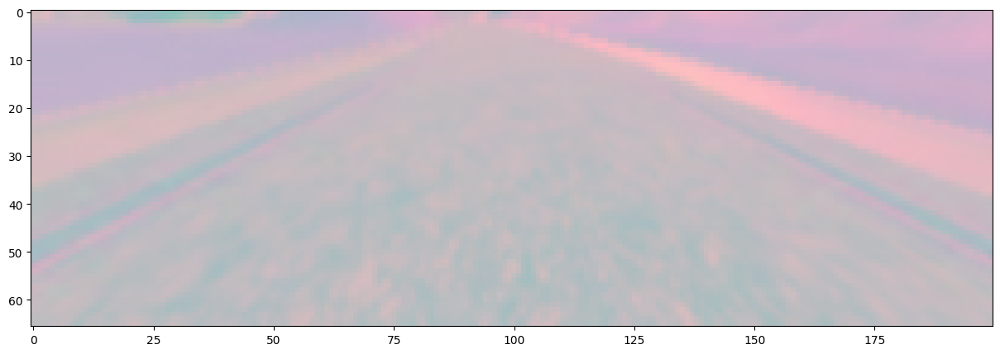

In [49]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.subplots(figsize=(15, 10))
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

dataiter = iter(training_loader)
img , angel = next(dataiter)

print(img.shape)

img_grid = torchvision.utils.make_grid(img)
matplotlib_imshow(img[1,:,:,:])



# Nvidia Auto Drive Model

In [50]:
class NvidiaDriver(nn.Module):
  def __init__(self):
    super(NvidiaDriver, self).__init__()

    self.conv1 = nn.Conv2d(in_channels=3,out_channels=24,kernel_size=(5, 5),stride=(2, 2))
    self.conv2 = nn.Conv2d(in_channels=24, out_channels=36, kernel_size=(5, 5), stride=(2, 2))
    self.conv3 = nn.Conv2d(in_channels=36, out_channels=48, kernel_size=(5, 5), stride=(2, 2))
    self.conv4 = nn.Conv2d(in_channels=48, out_channels=64, kernel_size=(3, 3), stride=(1, 1))
    #self.conv5 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3), stride=(1, 1))

    # Define fully connected layers
    self.fc1 = nn.Linear(64 * 3 * 20, 100) #need to calc it properly
    self.fc2 = nn.Linear(100, 50)
    self.fc3 = nn.Linear(50, 10)
    self.fc4 = nn.Linear(10, 1)

    # Define activation function
    self.elu = nn.ELU()

    # Dropout Layer
    self.drop = nn.Dropout(p=0.5, inplace=False)

  def forward(self, x):
        # Apply convolutional layers
        x = self.elu(self.conv1(x))
        x = self.elu(self.conv2(x))
        x = self.elu(self.conv3(x))
        x = self.elu(self.conv4(x))
        #x = self.elu(self.conv5(x))

        # Flatten the output for the fully connected layers
        x = x.view(-1, 64 * 3 * 20)
        #x = torch.flatten(x)
        #print(x.shape)

        # Applying dropout
        x = self.drop(x)

        # Apply fully connected layers with activation and dropout layer
        x = self.elu(self.fc1(x))

        x= self.drop(x)

        x = self.elu(self.fc2(x))

        x = self.drop(x)

        x = self.elu(self.fc3(x))

        x = self.drop(x)

        x = self.fc4(x)

        return x

In [51]:
model = NvidiaDriver()

# Print the model architecture
print(model)

NvidiaDriver(
  (conv1): Conv2d(3, 24, kernel_size=(5, 5), stride=(2, 2))
  (conv2): Conv2d(24, 36, kernel_size=(5, 5), stride=(2, 2))
  (conv3): Conv2d(36, 48, kernel_size=(5, 5), stride=(2, 2))
  (conv4): Conv2d(48, 64, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=3840, out_features=100, bias=True)
  (fc2): Linear(in_features=100, out_features=50, bias=True)
  (fc3): Linear(in_features=50, out_features=10, bias=True)
  (fc4): Linear(in_features=10, out_features=1, bias=True)
  (elu): ELU(alpha=1.0)
  (drop): Dropout(p=0.5, inplace=False)
)


# Model training

In [53]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

def train_one_epoch(epoch_index, tb_writer):
  running_loss = 0.
  last_loss = 0.
  i=0
  for img,ster in training_loader:

    optimizer.zero_grad()

    output = model(img)
    ster = ster.to(torch.float32)
    #print(ster.dtype) #debug
    output = output.squeeze(1)
    #print(output,ster)
    #ster = ster.unsqueeze(1)
    #print(ster.shape)

    loss = loss_fn(output, ster)
    loss.backward()

    # adjust weights
    optimizer.step()

    # Gather data and report
    running_loss += loss.item()
    if i % 1000 == 400:
            last_loss = running_loss / 400 # loss per batch
            print('  batch {} loss: {}'.format(i + 1, last_loss))
            tb_x = epoch_index * len(training_loader) + i + 1
            tb_writer.add_scalar('Loss/train', last_loss, tb_x)
            running_loss = 0.

    i=i+1

  return last_loss


In [54]:
#Initializing in a separate cell so we can easily add more epoches to the same run

timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
writer = SummaryWriter(f'runs/Nvidia_driver_{timestamp}')
epoch_number = 0

EPOCHS = 15

best_vloss = 1_000_000

for epoch in range(EPOCHS):
  print(f'EPOCH {epoch + 1}:')

  # Gradient tracking is on
  model.train(True)
  avg_loss = train_one_epoch(epoch, writer)

  running_vloss = 0.0

  #Set the model to evaluation mode, disabling dropout and using population statistics for batch normalization
  model.eval()
  i = 0

  with torch.no_grad():
    for img, ster in validation_loader:
      voutput = model(img)
      voutput = voutput.squeeze(1)
      #ster = ster.unsqueeze(1)
      vloss = loss_fn(voutput, ster)
      running_vloss += vloss

  avg_vloss = running_vloss / (i+1)
  print('LOSS train {} valid {}'.format(avg_loss, avg_vloss))

  # Log the running loss averaged per batch
  # for both training and validation
  writer.add_scalars('Training vs. Validation Loss',
                    { 'Training' : avg_loss, 'Validation' : avg_vloss },
                    epoch + 1)

  writer.flush()

  i=i+1

  # Tracking best performance, and save the model's state
  if avg_vloss < best_vloss:
    best_vloss = avg_vloss
    model_path = f'/content/model_{timestamp}_{epoch_number}'
    torch.save(model.state_dict(), model_path)

EPOCH 1:
LOSS train 0.0 valid 1.6880149503805084
EPOCH 2:
LOSS train 0.0 valid 1.3309155087333542
EPOCH 3:
LOSS train 0.0 valid 1.2382850829250278
EPOCH 4:
LOSS train 0.0 valid 1.0986731425224054
EPOCH 5:
LOSS train 0.0 valid 1.0980873770557487
EPOCH 6:
LOSS train 0.0 valid 0.9948124493459958
EPOCH 7:
LOSS train 0.0 valid 1.058354127720601
EPOCH 8:
LOSS train 0.0 valid 1.1584632153858125
EPOCH 9:
LOSS train 0.0 valid 1.0882964624865679
EPOCH 10:
LOSS train 0.0 valid 0.956696299837218
EPOCH 11:
LOSS train 0.0 valid 1.0041308855584854
EPOCH 12:
LOSS train 0.0 valid 1.0698271815192368
EPOCH 13:
LOSS train 0.0 valid 0.9607509697645131
EPOCH 14:
LOSS train 0.0 valid 0.9378232650714557
EPOCH 15:
LOSS train 0.0 valid 0.8868585205873025


# Saving the entire model not only reference

In [55]:
torch.save(model, '/content/NvidiaAutoDrive')

In [56]:
from google.colab import files
files.download('/content/NvidiaAutoDrive')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [57]:
# Downloading reference of model
from google.colab import files
files.download('/content/model_20240310_070414_0')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [62]:
# m1 = NvidiaDriver()
m1 = torch.load('/content/NvidiaAutoDrive')